In [1]:
%load_ext autoreload
%autoreload 2
%matplotlib inline

import sys
sys.path.append('/home/mer49/Dropbox (Cambridge University)/OLeary/Code')
from neurotools.nlab import *
import numpy as np
import matplotlib.pyplot as plt
from scipy.spatial import Voronoi, voronoi_plot_2d
#mpl.rcParams["savefig.dpi"]=140
mpl.rcParams["figure.dpi" ]=140


## Coloring based on nearest hybercube

Define a planar cut through an ND lattice, and color pixels on this plane according to nearest cube.

Note: To simplify some things later:
- Ensure that all angles are positive
- Ensure that the last angle is π (vertical)

In [2]:
from scipy.spatial.distance import squareform, pdist
from pylab import *
from numpy import * 

N = 6                      # Dimension of crystal
θ = linspace(0,pi,N+1)[1:] # Arrange basis vectors evenly on [0,π)
A = array([cos(θ),sin(θ)]) # Convert from complex notation

L  = 1001  # Number of grid points to search over
dx = 4    # Size of square portion of plane to check

# Generate the search grid
x  = linspace(-dx,dx,L)
xy = array(meshgrid(x,x)).reshape(2,L*L)

# Collapse all grid points to the nearest hyper-cell 
p  = np.round(A.T@xy)

# Refer to each intersected hypercel by the projection of
# its center on the plane. Encode these pts as complex numbers
u  = [1,1j]@pinv(A).T@p
q  = unique(u)

def plotpoints(p):
    u  = pinv(A).T@p
    D  = squareform(pdist(p.T))
    e  = {tuple(sorted(e)) for e in zip(*where(abs(D-1)<1e-6))}
    xy = concatenate([[u[:,a],u[:,b],[NaN,NaN]] for a,b in e])
    plot(*xy.T,lw=0.5,color='k')
    tight_layout()
    axis("equal")
    axis("off")

## Better way

- Waves cut up plane into strips
- Each strip is identified by an integer
- Integers for all strips are indecies for a cell in the (hyper)lattice
- If a set of N strips intersects in the plane, then the plane intersects the corresponding hypercell
- The intersection of N strips can be computed as the intersection of 2N half-planes
- We can test this using linear programming, or the Preparata and Muller algorithm

## Strip intersection, linear programming variant

- Recursively search for cells intersecting the plane, starting from an initial "seed"
- Use linear programming to check whether plane intersects each cell
- Restrict search space and cache results to reduce computatoinal cost
  - For a $N$-d quasicrystal, we get $2N$-fold symmetry about the origin. There is also a reflection symmetry. 
- Convert lattice indicies into 2N half-plane intersections
 - I think this amounts to projecting they hyperlattice point onto the cutting plane, and then 

In [3]:
from scipy.optimize import linprog

# Number of search iterations
Ndepth = 15

# Directions in which to search
D = int32(concatenate([eye(N),-eye(N)])) 

# Matrix to rotate a lattice point π/N in 2D plane
S = zeros((N,N))
S[ -1,0 ] = -1
S[:-1,1:] = eye(N-1)

# Generic caching intersection check function
# Map all points to first quadrant and memoize
def cached_crystal_checker(check):
    # Cache results to save time (memoization)
    cache = {}
    def f(q):
        # Convert test point to immutable tuple for cache key
        k = tuple(int32(q)) 
        if not k in cache:
            # Recompute intersection test if not in cache
            # Use symmetry: reduce tests to points in 1st sector
            h = angle([1,1j]@A@q)
            cache[k]=check(q) if 0<=h<=(pi/N*1.1) else f(S@q)
        return cache[k]
    f.__cache__ = cache
    return f

## Strap intersection using intersection of half planes $N \log(N)$

- Create upper/lower feasibility region
- Ternary search to check if nonempty


In [9]:
# Get slopes and spacing of boundary lines
m = 1/tan(θ[:-1])
d = 1/sin(θ[:-1])

@cached_crystal_checker
def check_pm(p,eps=1e-3,maxiter=1000):
    p = int32(p)
    # Evaluate upper/lower bounds
    lp,up = p[:-1]-0.5, p[:-1]+0.5
    def feasibility_surface(p,x):
        u,l = x*m+up*d, x*m+lp*d
        y   = np.max(l)-np.min(u)
        dy  = m[np.argmax(l)]-m[np.argmin(u)]
        return y,dy
    # Initial bounds and feasability checks
    # If either bound satisfies, success
    # If better point not in bounds, fail
    x0,x1  = p[-1]-0.5, p[-1]+0.5
    y0,dy0 = feasibility_surface(p,x0)
    y1,dy1 = feasibility_surface(p,x1)
    if y0 < 0 or y1 < 0: return True
    if dy0>=0 or dy1<=0: return False
    for i in range(maxiter):
        # Guess min by following slope at bounds
        xm = (y1-y0-dy1*x1+dy0*x0)/(dy0-dy1)
        assert xm>=x0-eps
        assert xm<=x1+eps
        # Midpoint works? still feasible? 
        ym,dym = feasibility_surface(p,xm)
        if ym<0:   return True
        if dym==0: return False
        # Binary search: move inward if not done
        if dym<0:
            # If better point not in bounds, fail
            if dym>=0 or abs(x0-xm)<eps: return False
            x0,y0,dy0 = xm,ym,dym
        else:
            if dym<=0 or abs(x1-xm)<eps: return False
            x1,y1,dy1 = xm,ym,dym
    # Should have returned succes/fail before getting here
    raise RuntimeError("Maximum iterations exceeded: p=%s"%p)

# Start with a seed point at zero and build outwards
# Iteratively search in each direction to add points
Q,allQ = {(0,)*N},set() 
for i in range(300):
    Q = {tuple(q) for p in Q for q in D+p if check_pm(q)}-allQ
    allQ |= Q

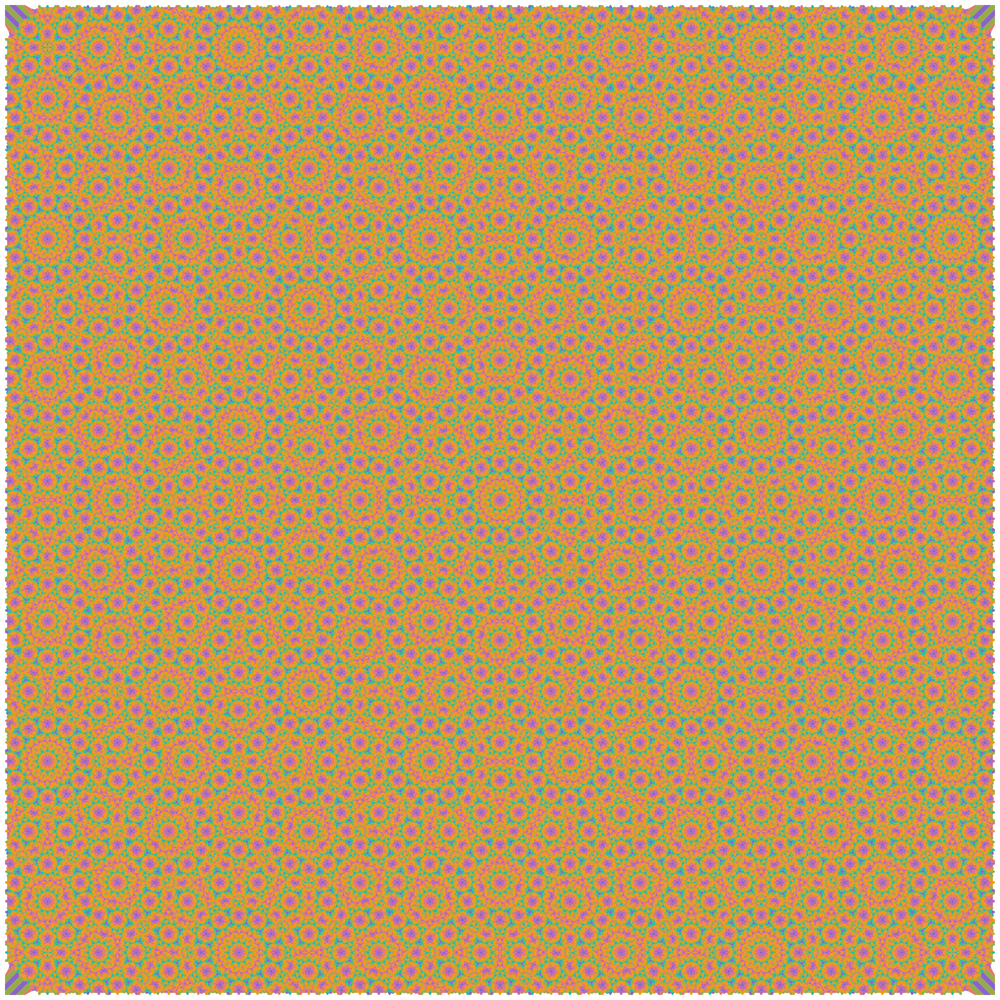

In [10]:
colors = riley(linspace(0,.8,N+1))

p = array(list(allQ)).T
points = (pinv(A).T@p).T
dx = np.max(points)
m  = 1/tan(θ[:-1])
d  = 1/sin(θ[:-1])

T=dx/sqrt(2)

# make up data points
keep = np.max(abs(points),axis=1)<T
points = points[keep]
vor = Voronoi(points)
mod2 = sum(p[:,keep]%2,0)%(N)

# plot
figure(figsize=(20,20))
# colorize
for i,pt in enumerate(points):
    region = vor.regions[vor.point_region[i]]
    if not -1 in region:
        color = colors[mod2[i]]
        polygon = [list(vor.vertices[i]) for i in region]
        plt.fill(*zip(*polygon),matplotlib.colors.to_hex(color))
xlim(-T,T)
ylim(-T,T)
axis("off")
tight_layout()
savefig("colors.png")
savefig("colors.pdf")